In [1]:
#to get the current working directory
import os 
os.getcwd()
#to change the working directory to the assessment folder
os.chdir('C:/Users/cex/Documents/Smart Cities and Urban Analytics/Term 2/SDC/Assessment')
#to check what working directory ends up as
os.getcwd()

'C:\\Users\\cex\\Documents\\Smart Cities and Urban Analytics\\Term 2\\SDC\\Assessment'

In [2]:
# import libraries, and set pd as the pandas alias
import pandas as pd

# run this command too - just to allow more data to be displayed than default
pd.set_option('display.max_rows', 200)
# this one ensures graphs properly display in the notebook
%matplotlib inline

In [3]:
#import the transport csv
transport = pd.read_csv('Data/wu03ew_msoa.csv')

In [4]:
#check the output
transport

,Area of residence,Area of workplace,All categories: Method of travel to work,Work mainly at or from home,"Underground, metro, light rail, tram",Train,"Bus, minibus or coach",Taxi,"Motorcycle, scooter or moped",Driving a car or van,Passenger in a car or van,Bicycle,On foot,Other method of travel to work
0,E02000001,E02000001,1506,0,73,41,32,9,1,8,1,33,1304,4
1,E02000001,E02000014,2,0,2,0,0,0,0,0,0,0,0,0
2,E02000001,E02000016,3,0,1,0,2,0,0,0,0,0,0,0
3,E02000001,E02000025,1,0,0,1,0,0,0,0,0,0,0,0
4,E02000001,E02000028,1,0,0,0,0,0,0,1,0,0,0,0
5,E02000001,E02000051,1,0,1,0,0,0,0,0,0,0,0,0
6,E02000001,E02000053,2,0,2,0,0,0,0,0,0,0,0,0
7,E02000001,E02000057,1,0,1,0,0,0,0,0,0,0,0,0
8,E02000001,E02000058,1,0,0,0,0,0,0,0,0,0,1,0
9,E02000001,E02000059,1,0,0,0,0,1,0,0,0,0,0,0


In [5]:
#merge by origin MSOA and sum over all transport options
transport_msoa = transport.groupby("Area of residence").sum()
transport_msoa

,All categories: Method of travel to work,Work mainly at or from home,"Underground, metro, light rail, tram",Train,"Bus, minibus or coach",Taxi,"Motorcycle, scooter or moped",Driving a car or van,Passenger in a car or van,Bicycle,On foot,Other method of travel to work
Area of residence,,,,,,,,,,,,
E02000001,4785,701,880,260,265,43,22,135,11,243,2184,41
E02000002,2484,159,389,204,366,20,22,1076,87,33,116,12
E02000003,4539,313,580,901,482,22,31,1778,103,40,268,21
E02000004,2858,182,290,393,285,19,31,1322,92,38,193,13
E02000005,3595,226,446,442,542,19,33,1503,122,57,199,6
E02000007,3322,180,629,278,517,17,32,1310,103,47,200,9
E02000008,4558,250,769,479,652,13,50,1853,170,64,242,16
E02000009,3499,225,612,385,553,13,45,1358,109,57,129,13
E02000010,3435,175,834,315,415,17,25,1300,85,37,215,17


In [6]:
public_transport = transport_msoa["Underground, metro, light rail, tram"] + transport_msoa["Train"] + transport_msoa["Bus, minibus or coach"]
private_transport = transport_msoa["Taxi"] + transport_msoa["Motorcycle, scooter or moped"] + transport_msoa["Driving a car or van"] + transport_msoa["Passenger in a car or van"]
person_power = transport_msoa["Bicycle"] + transport_msoa["On foot"]

In [7]:
transport_msoa["Public_transport"] = public_transport
transport_msoa["Private_transport"] = private_transport
transport_msoa["person_power"] = person_power

In [8]:
transport_msoa

,All categories: Method of travel to work,Work mainly at or from home,"Underground, metro, light rail, tram",Train,"Bus, minibus or coach",Taxi,"Motorcycle, scooter or moped",Driving a car or van,Passenger in a car or van,Bicycle,On foot,Other method of travel to work,Public_transport,Private_transport,person_power
Area of residence,,,,,,,,,,,,,,,
E02000001,4785,701,880,260,265,43,22,135,11,243,2184,41,1405,211,2427
E02000002,2484,159,389,204,366,20,22,1076,87,33,116,12,959,1205,149
E02000003,4539,313,580,901,482,22,31,1778,103,40,268,21,1963,1934,308
E02000004,2858,182,290,393,285,19,31,1322,92,38,193,13,968,1464,231
E02000005,3595,226,446,442,542,19,33,1503,122,57,199,6,1430,1677,256
E02000007,3322,180,629,278,517,17,32,1310,103,47,200,9,1424,1462,247
E02000008,4558,250,769,479,652,13,50,1853,170,64,242,16,1900,2086,306
E02000009,3499,225,612,385,553,13,45,1358,109,57,129,13,1550,1525,186
E02000010,3435,175,834,315,415,17,25,1300,85,37,215,17,1564,1427,252


In [9]:
transport_msoa["Public_transport_perc"] = transport_msoa["Public_transport"] / transport_msoa["All categories: Method of travel to work"]
transport_msoa["Private_transport_perc"] = transport_msoa["Private_transport"] / transport_msoa["All categories: Method of travel to work"]
transport_msoa["People_power_perc"] = transport_msoa["person_power"] / transport_msoa["All categories: Method of travel to work"]

In [10]:
transport_msoa

,All categories: Method of travel to work,Work mainly at or from home,"Underground, metro, light rail, tram",Train,"Bus, minibus or coach",Taxi,"Motorcycle, scooter or moped",Driving a car or van,Passenger in a car or van,Bicycle,On foot,Other method of travel to work,Public_transport,Private_transport,person_power,Public_transport_perc,Private_transport_perc,People_power_perc
Area of residence,,,,,,,,,,,,,,,,,,
E02000001,4785,701,880,260,265,43,22,135,11,243,2184,41,1405,211,2427,0.293626,0.044096,0.507210
E02000002,2484,159,389,204,366,20,22,1076,87,33,116,12,959,1205,149,0.386071,0.485105,0.059984
E02000003,4539,313,580,901,482,22,31,1778,103,40,268,21,1963,1934,308,0.432474,0.426085,0.067856
E02000004,2858,182,290,393,285,19,31,1322,92,38,193,13,968,1464,231,0.338698,0.512246,0.080826
E02000005,3595,226,446,442,542,19,33,1503,122,57,199,6,1430,1677,256,0.397775,0.466481,0.071210
E02000007,3322,180,629,278,517,17,32,1310,103,47,200,9,1424,1462,247,0.428657,0.440096,0.074353
E02000008,4558,250,769,479,652,13,50,1853,170,64,242,16,1900,2086,306,0.416849,0.457657,0.067135
E02000009,3499,225,612,385,553,13,45,1358,109,57,129,13,1550,1525,186,0.442984,0.435839,0.053158
E02000010,3435,175,834,315,415,17,25,1300,85,37,215,17,1564,1427,252,0.455313,0.415429,0.073362


In [11]:
import plotly.express as px
fig = px.scatter_3d(transport_msoa, x='Public_transport_perc', y='Private_transport_perc', z='People_power_perc',
                   opacity = 0.6)
fig.show()

In [12]:
transport_percentage = transport_msoa[["Private_transport_perc", "Public_transport_perc", "People_power_perc"]]

In [13]:
import sklearn.preprocessing as preprocessing

#this takes arguments: X ,axis = 0, with_mean = True, with_std = True, copy = True
#X is the data to centre and scale
#axs: int (0 by default) - axis used to compute means and Std along, if 0  independentky
#standardise each feature, other (if 1) standardize each sample
#with_mean: boolean, True by default, if true centre the data before scaling
#with_std: boolean, True by default, if True scale the data to unit variance
#copy: boolean, optional, default True, set to False to perform inplace row normalisation and avoid a copy

#NaNs are treated as missing values: disregarded

scaled = preprocessing.scale(transport_percentage) # add your dataframe name here

#this creates a numpy array
scaled

array([[-3.47582701,  0.93505916,  5.01274159],
       [-0.7808865 ,  1.55333311, -0.8449119 ],
       [-1.14154707,  1.86367921, -0.74180045],
       ...,
       [ 0.39093529, -0.87913788, -0.976733  ],
       [-0.18890893, -0.15692717,  1.28222464],
       [-0.85984738, -0.03911555,  2.43224561]])

In [14]:
scaled_df = pd.DataFrame({'Private_transport': scaled[:, 0], 'Public _transport': scaled[:, 1], 'People_power':scaled[:, 2]})
print(scaled_df)

      Private_transport  Public _transport  People_power
0             -3.475827           0.935059      5.012742
1             -0.780886           1.553333     -0.844912
2             -1.141547           1.863679     -0.741800
3             -0.615028           1.236505     -0.571931
4             -0.894692           1.631609     -0.697875
5             -1.055926           1.838153     -0.656712
6             -0.948616           1.759181     -0.751252
7             -1.081943           1.933968     -0.934315
8             -1.206662           2.016426     -0.669683
9             -1.290841           2.013479     -0.702750
10            -1.267143           2.004879     -0.795454
11            -1.038976           1.860621     -0.805293
12            -1.279705           1.990316     -0.537075
13            -1.325883           2.016969     -0.484739
14            -2.456621           3.350468     -0.684371
15            -1.914147           2.595369     -0.533573
16            -1.240784        

In [15]:
fig2 = px.scatter_3d(scaled_df, x='Private_transport', y='Public _transport', z='People_power', opacity = 0.5)
fig2.show()

In [16]:
from sklearn.cluster import DBSCAN
#eps is the maximum distance between two samples for one to be considered as in the neighbourhood of other other
#min samples is the number of samples within that distance to make that point a core point, this includes the point itself
dbscan = DBSCAN(eps=0.1, min_samples=5) # create DBSCAN cluster object

#this also takes several other arguments e.g.
#metric= 'euclidean', metric_params=None, algorith='auto', leaf_szie=30, p = None, n_jobs=None

#algorith to be used by the NearestNeighbors module to compute pointwise distance and find neighest neighbours - see NN module documentation
dbscan.fit(scaled) # run the .fit() function on the scaled dataset


DBSCAN(algorithm='auto', eps=0.1, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=None, p=None)

In [17]:
dbscan.fit(transport_percentage)

DBSCAN(algorithm='auto', eps=0.1, leaf_size=30, metric='euclidean',
       metric_params=None, min_samples=5, n_jobs=None, p=None)

In [18]:
dbscan_labels = dbscan.labels_

In [19]:
from sklearn import metrics
metrics.silhouette_score(scaled, dbscan_labels)

0.4667646508987287

In [20]:
transport_percentage=transport_percentage.assign(label = dbscan_labels)

In [21]:
transport_percentage.label.value_counts()

 0    7199
-1       2
Name: label, dtype: int64

In [22]:
n_clusters_ = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise_ = list(dbscan_labels).count(-1)

print(n_clusters_)
print(n_noise_)

1
2


In [23]:


fig3 = px.scatter_3d(transport_percentage, x='Private_transport_perc', y='People_power_perc', z='Public_transport_perc', opacity = 0.5, color = 'label')
fig3.show()

# # kmeans clustering

In [24]:
from sklearn.cluster import KMeans

In [25]:
k_cluster = 5
random_seed = 1
#random state: int, default = None
#determines random number generation for ecntroid intialisation, use an int to make the randomness deterministic

kmeans_method = KMeans(n_clusters=k_cluster,random_state=random_seed)
kmeans_method.fit(scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=1, tol=0.0001, verbose=0)

In [26]:
transport_percenatege_kmeans = transport_percentage.assign(label = kmeans_method.labels_)

In [27]:
fig4 = px.scatter_3d(transport_percenatege_kmeans, x='Private_transport_perc', y='People_power_perc', z='Public_transport_perc', opacity = 0.5, color = 'label')
fig4.show()

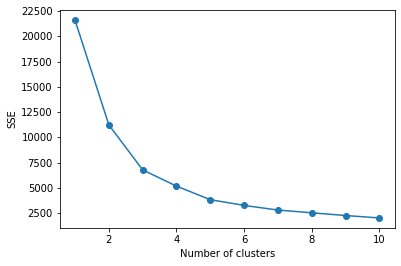

In [69]:
import matplotlib.pyplot as plt
# calculate SSE for a range of number of cluster
list_SSE = []
min_k = 1
max_k = 10
range_k = range(min_k, max_k+1)
for i in range_k:
    km = KMeans(
        n_clusters=i, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(scaled)
    # inertia is a concept in physics. Roughly it means SSE of clustering.
    list_SSE.append(km.inertia_)

# plot
plt.plot(range_k, list_SSE, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

In [28]:
k_cluster = 4
random_seed = 15
kmeans_method_100 = KMeans(n_clusters=k_cluster,random_state=random_seed)
kmeans_method_100.fit(scaled)
# add labels to the dataset
transport_percentage_kmeans_100 = transport_percentage.assign(label = kmeans_method_100.labels_)
# visualise the labels

In [29]:
fig5 = px.scatter_3d(transport_percentage_kmeans_100, x='Private_transport_perc', y='People_power_perc', z='Public_transport_perc', opacity = 0.5, color = 'label')
fig5.show()

In [30]:

label = kmeans_method_100.labels_

metrics.silhouette_score(scaled, label)

0.41464021567387127

In [31]:
#import random
import random
#set an empty array to store the silhouette 
silhouette = []

#iterate over the number of clusters from 2 to 10
for i in range(2, 10):
    #create an empty array to store the average
    average = []
    #repeat the kmeans clustering 10 times
    for x in range(1, 10):
        #setting the number of clusters as i
        k_cluster = i
        #create a random integer for the random seed
        random_seed = random.randint(1,101)
        #run the kmeans analysis
        kmeans_method = KMeans(n_clusters=k_cluster,random_state=random_seed)
        #fit it to the scaled dataset
        kmeans_method.fit(scaled)
        #get the labels
        labels = kmeans_method.labels_
        #get the silhouette score
        a = metrics.silhouette_score(scaled, labels)
        #append it to the average list
        average.append(a)
    #get the silhouette score and append it to the silhouette 
    silhouette.append(sum(average)/len(average))

In [32]:
#consider the silhouette scores
silhouette

[0.5849970645671198,
 0.5249023099502305,
 0.41443863773502476,
 0.44440815058822286,
 0.38087673286349866,
 0.3857565735619583,
 0.3785665086455448,
 0.3394470472369377]

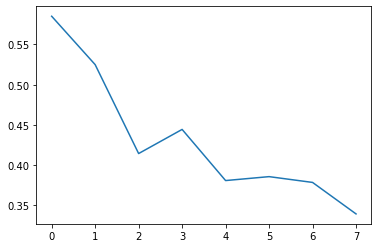

In [34]:
import matplotlib.pyplot as plt
#print the silhouette score - starting at 2 clusters
plt.plot(silhouette)

In [38]:
#create a new dataframe

transport_msoa1 = transport_msoa

sustainable_transport1 = transport_msoa["Underground, metro, light rail, tram"] + transport_msoa["Train"] + transport_msoa["Bus, minibus or coach"] + transport_msoa["Bicycle"] + transport_msoa["On foot"]
private_transport1 = transport_msoa["Taxi"] + transport_msoa["Motorcycle, scooter or moped"] + transport_msoa["Driving a car or van"] + transport_msoa["Passenger in a car or van"]

transport_msoa1["Sustainable_transport"] = sustainable_transport1
transport_msoa1["Private_transport"] = private_transport1

transport_msoa1["Sustainable_perc"] = transport_msoa1["Sustainable_transport"]/transport_msoa1["All categories: Method of travel to work"]
transport_msoa1["Private_perc"] = transport_msoa1["Private_transport"]/transport_msoa1["All categories: Method of travel to work"]

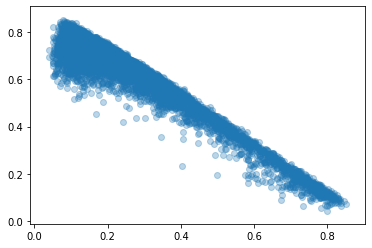

In [41]:
plt.scatter(transport_msoa1["Sustainable_perc"], transport_msoa1["Private_perc"], alpha = 0.3 )

In [44]:
import plotly.express as px
fig = px.scatter(x=transport_msoa1["Sustainable_perc"], y = transport_msoa1["Private_perc"])
fig.show()

In [45]:
#create a new dataframe

transport_msoa2 = transport_msoa

sustainable_transport1 = transport_msoa["Underground, metro, light rail, tram"] + transport_msoa["Train"] + transport_msoa["Bus, minibus or coach"] 
private_transport1 = transport_msoa["Taxi"] + transport_msoa["Motorcycle, scooter or moped"] + transport_msoa["Driving a car or van"] + transport_msoa["Passenger in a car or van"]

transport_msoa2["Sustainable_transport"] = sustainable_transport1
transport_msoa2["Private_transport"] = private_transport1

transport_msoa2["Sustainable_perc"] = transport_msoa2["Sustainable_transport"]/transport_msoa1["All categories: Method of travel to work"]
transport_msoa2["Private_perc"] = transport_msoa2["Private_transport"]/transport_msoa1["All categories: Method of travel to work"]

In [46]:
fig = px.scatter(x=transport_msoa2["Sustainable_perc"], y = transport_msoa2["Private_perc"])
fig.show()

In [51]:
transport_msoa_2 = transport_msoa2[["Sustainable_perc", "Private_perc"]]
transport_msoa_2

,Sustainable_perc,Private_perc
Area of residence,,
E02000001,0.293626,0.044096
E02000002,0.386071,0.485105
E02000003,0.432474,0.426085
E02000004,0.338698,0.512246
E02000005,0.397775,0.466481
E02000007,0.428657,0.440096
E02000008,0.416849,0.457657
E02000009,0.442984,0.435839
E02000010,0.455313,0.415429


In [52]:
#attempt to check the new dataset

#set an empty array to store the silhouette 
silhouette2 = []

#iterate over the number of clusters from 2 to 10
for i in range(2, 10):
    #create an empty array to store the average
    average = []
    #repeat the kmeans clustering 10 times
    for x in range(1, 10):
        #setting the number of clusters as i
        k_cluster = i
        #create a random integer for the random seed
        random_seed = random.randint(1,101)
        #run the kmeans analysis
        kmeans_method = KMeans(n_clusters=k_cluster,random_state=random_seed)
        #fit it to the scaled dataset
        kmeans_method.fit(transport_msoa_2)
        #get the labels
        labels = kmeans_method.labels_
        #get the silhouette score
        a = metrics.silhouette_score(transport_msoa_2, labels)
        #append it to the average list
        average.append(a)
    #get the silhouette score and append it to the silhouette 
    silhouette2.append(sum(average)/len(average))

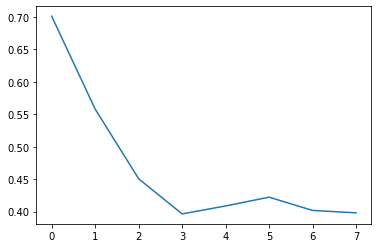

In [53]:
import matplotlib.pyplot as plt
#print the silhouette score - starting at 2 clusters
plt.plot(silhouette2)

#this suggests two clusters

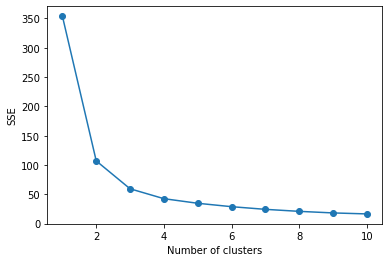

In [54]:
import matplotlib.pyplot as plt
# calculate SSE for a range of number of cluster
list_SSE = []
min_k = 1
max_k = 10
range_k = range(min_k, max_k+1)
for i in range_k:
    km = KMeans(
        n_clusters=i, init='random',
        n_init=10, max_iter=300,
        tol=1e-04, random_state=0
    )
    km.fit(transport_msoa_2)
    # inertia is a concept in physics. Roughly it means SSE of clustering.
    list_SSE.append(km.inertia_)

# plot
plt.plot(range_k, list_SSE, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

#this suggests three clusters

## Agglomerative clustering

In [56]:
from sklearn.cluster import AgglomerativeClustering

In [66]:
n_clusters = 4

hierarchy = AgglomerativeClustering(n_clusters = n_clusters)

hierarchy.fit(transport_percentage)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=4,
                        pooling_func='deprecated')

In [67]:
transport_percentage_hierarchy = transport_percentage.assign(label = hierarchy.labels_)

In [68]:
fig6 = px.scatter_3d(transport_percentage_hierarchy, x='Private_transport_perc', y='People_power_perc', z='Public_transport_perc', opacity = 0.5, color = 'label')
fig6.show()